# scRNAseq Data Analysis - Data Integration

# Setup

This notebook should introduce you to some typical tasks, using Scanpy eco-system.(https://scanpy.readthedocs.io/en/stable/tutorials.html).


Let's import the necessary packages and read in the Cellranger-formatted data folder output.

In [1]:
import scanpy as sc
import numpy as np
import re
import os
import pandas as pd
import seaborn as sb
import matplotlib
import scipy.sparse as sp
from scipy.sparse import issparse
import anndata2ri

import matplotlib as mpl
from scipy import stats as scistats
import matplotlib.pyplot as pl
import scanpy.external as sce
from matplotlib import colors
import bbknn
from pathlib import Path
from ipywidgets import interactive

sc._settings.ScanpyConfig.n_jobs=8

pl.rcParams['pdf.fonttype'] = 'truetype'
sc.set_figure_params(vector_friendly=False,dpi_save=300,transparent=True)
pl.rcParams['lines.linewidth'] = 0.1
sc.set_figure_params(color_map='viridis')
colorsComb = np.vstack([pl.cm.Reds(np.linspace(0, 1, 10)), pl.cm.Greys_r(np.linspace(0.7, 0.8, 0))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

import muon as mu
from muon import prot as pt

%matplotlib inline
import panel as pn
#pn.extension(sizing_mode="stretch_width", comms='colab')
pn.extension( comms='colab')


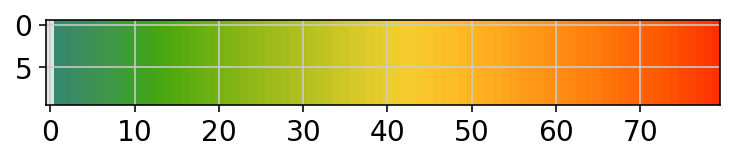

In [2]:
import colorcet as cc

xs, _ = np.meshgrid(np.linspace(0, 1, 80), np.linspace(0, 1, 10))
colorsComb = np.vstack([pl.cm.Greys_r(np.linspace(0.8,0.1, 1)), cc.cm.rainbow_bgyr_35_85_c72(np.linspace(0.2,1, 100))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
pl.imshow(xs, cmap=mymap);  # use tab completion to choose

In [3]:
# add extra code to the path
import sys
sys.path.append('/content/sctoolkit/sctoolkit/')
from proportions import *

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.


# PART 0. Reproducibility

In [4]:
%load_ext watermark
%watermark
%watermark --iversions -v -m -p numpy,scipy,sklearn,anndat|a,scanpy,muon,anndata2ri,rpy2

Last updated: 2022-07-15T17:11:40.718638+00:00

Python implementation: CPython
Python version       : 3.9.12
IPython version      : 8.3.0

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 5.13.0-1031-aws
Machine     : x86_64
Processor   : x86_64
CPU cores   : 64
Architecture: 64bit

Python implementation: CPython
Python version       : 3.9.12
IPython version      : 8.3.0

numpy     : 1.21.6
scipy     : 1.8.0
sklearn   : 0.0
anndat|a  : not installed
scanpy    : 1.9.1
muon      : 0.1.2
anndata2ri: 1.1
rpy2      : 3.5.1

Compiler    : GCC 10.3.0
OS          : Linux
Release     : 5.13.0-1031-aws
Machine     : x86_64
Processor   : x86_64
CPU cores   : 64
Architecture: 64bit

panel     : 0.13.1
scanpy    : 1.9.1
numpy     : 1.21.6
colorcet  : 3.0.0
muon      : 0.1.2
sys       : 3.9.12 | packaged by conda-forge | (main, Mar 24 2022, 23:25:59) 
[GCC 10.3.0]
matplotlib: 3.5.2
logging   : 0.5.1.2
scipy     : 1.8.0
anndata2ri: 1.1
bbknn     : 1.5.1
pandas    : 1.2.5
seaborn   : 0.11.2


# PART 1. Data merging 

# Setup data directory

In [5]:
data_dir = '/home/jovyan/work/public-data/scRNA/'

In [6]:
%cd /home/jovyan/work/

/home/jovyan/work


In [7]:
#Change XXX to sample name
#folder='/content/'

yourname='Meethila'

samplename='Heart'
random_state=42

import os

if not os.path.exists('./figures/'):
    os.makedirs('./figures/')

# Load Sample3

shared-data/Multiome_Results/Brain/filtered_feature_bc_matrix/matrix.mtx.gz# import data as H5AD

public-data/scRNA/Cell_line2_JT_outs/filtered_feature_bc_matrix
Reading the matrix with cache enabled helps save time on I/O operations, which is particularly relevant for bigger datasets.

In [8]:
adata1 = sc.read_10x_mtx(data_dir + "/Cell_line3_T4_outs/filtered_feature_bc_matrix/",cache = True)#loading one ind sample 
adata1

AnnData object with n_obs × n_vars = 5733 × 36601
    var: 'gene_ids', 'feature_types'

In [9]:
adata1.obs['sample']=['Cellline3']*adata1.n_obs #for annotating cell line CHANGE ECERY LINE 
adata1.obs['group']=['JT']*adata1.n_obs
adata1

AnnData object with n_obs × n_vars = 5733 × 36601
    obs: 'sample', 'group'
    var: 'gene_ids', 'feature_types'

In [10]:
sce.pp.scrublet(adata1,expected_doublet_rate = 0.05,threshold=None)
#scrublet meant to be used on an ind sample 

/opt/conda/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


Automatically set threshold at doublet score = 0.47
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.0%


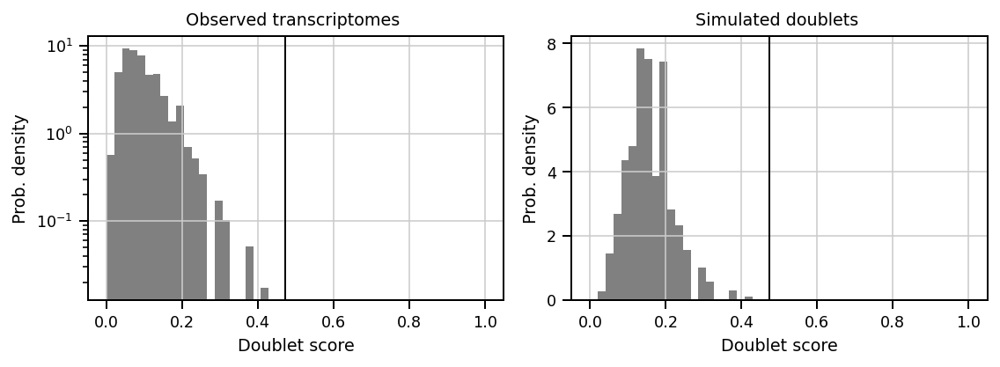

In [11]:
sb.set_context('paper')
savefig=samplename + '_7_QC_doublets.pdf'
sce.pl.scrublet_score_distribution(adata1,save=savefig)

In [12]:
adata1 = adata1[adata1.obs.predicted_doublet == False]
adata1

View of AnnData object with n_obs × n_vars = 5733 × 36601
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types'
    uns: 'scrublet'

# Load Sample5

In [13]:
adata2 = sc.read_10x_mtx(data_dir + "/Cell_line5_SH_outs/filtered_feature_bc_matrix/",cache = True)
adata2

AnnData object with n_obs × n_vars = 2213 × 36601
    var: 'gene_ids', 'feature_types'

In [14]:
adata2.obs['sample']=['Cellline5']*adata2.n_obs
adata2.obs['group']=['SH']*adata2.n_obs
adata2

AnnData object with n_obs × n_vars = 2213 × 36601
    obs: 'sample', 'group'
    var: 'gene_ids', 'feature_types'

In [15]:
sce.pp.scrublet(adata2,expected_doublet_rate = 0.05,threshold=None)

/opt/conda/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


Automatically set threshold at doublet score = 0.44
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 0.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 17.1%


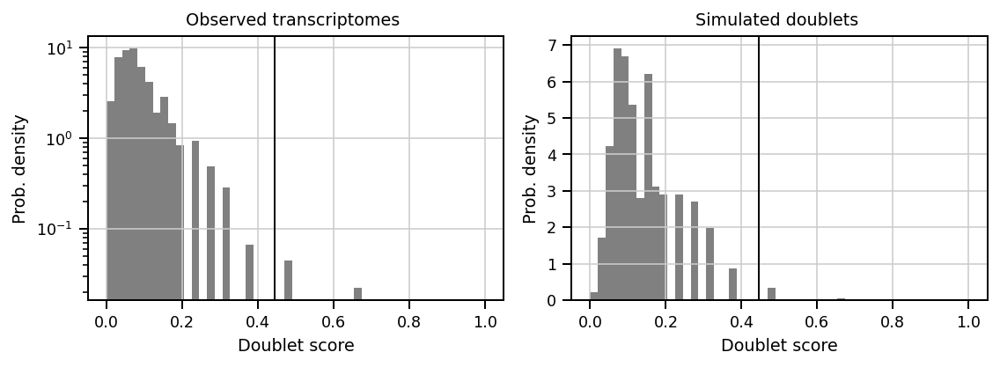

In [16]:
sb.set_context('paper')
savefig=samplename + '_7_QC_doublets.pdf'
sce.pl.scrublet_score_distribution(adata2,save=savefig)

In [17]:
adata2 = adata2[adata2.obs.predicted_doublet == False]
adata2


View of AnnData object with n_obs × n_vars = 2210 × 36601
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types'
    uns: 'scrublet'

# Load Sample1

In [18]:
adata3 = sc.read_10x_mtx(data_dir + "/Cell_line1_M_outs/filtered_feature_bc_matrix/",cache = True)
adata3

AnnData object with n_obs × n_vars = 12868 × 36601
    var: 'gene_ids', 'feature_types'

In [19]:
adata3.obs['sample']=['Cellline1']*adata3.n_obs #for annotating cell line CHANGE ECERY LINE 
adata3.obs['group']=['CL2']*adata3.n_obs
adata3

AnnData object with n_obs × n_vars = 12868 × 36601
    obs: 'sample', 'group'
    var: 'gene_ids', 'feature_types'

In [20]:
sce.pp.scrublet(adata3,expected_doublet_rate = 0.05,threshold=None)
#scrublet meant to be used on an ind sample 

/opt/conda/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


Automatically set threshold at doublet score = 0.51
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 61.5%


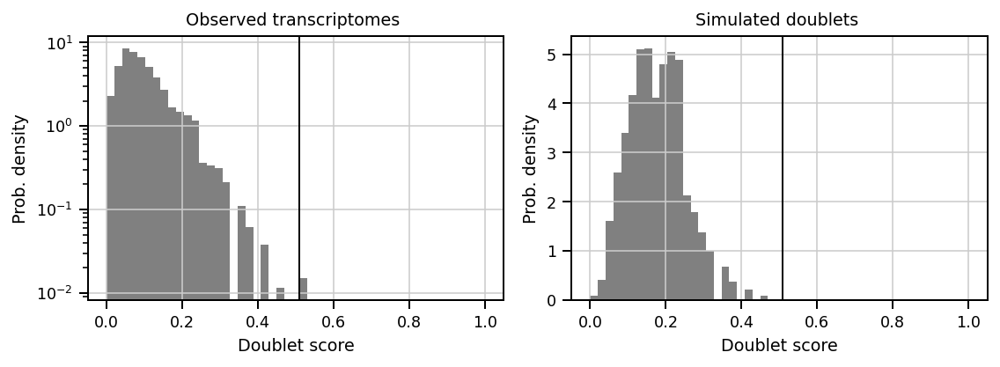

In [21]:
sb.set_context('paper')
savefig=samplename + '_7_QC_doublets.pdf'
sce.pl.scrublet_score_distribution(adata3,save=savefig)

In [22]:
adata3 = adata3[adata3.obs.predicted_doublet == False]
adata3


View of AnnData object with n_obs × n_vars = 12864 × 36601
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types'
    uns: 'scrublet'

# Sample 2

In [23]:
adata4 = sc.read_10x_mtx(data_dir + "/Cell_line2_CS_outs/filtered_feature_bc_matrix/",cache = True)
adata4

AnnData object with n_obs × n_vars = 223 × 36601
    var: 'gene_ids', 'feature_types'

In [24]:
adata4.obs['sample']=['Cellline2']*adata4.n_obs #for annotating cell line CHANGE ECERY LINE 
adata4.obs['group']=['CS']*adata4.n_obs
adata4

AnnData object with n_obs × n_vars = 223 × 36601
    obs: 'sample', 'group'
    var: 'gene_ids', 'feature_types'

In [25]:
sce.pp.scrublet(adata4,expected_doublet_rate = 0.05,threshold=None)
#scrublet meant to be used on an ind sample 

Automatically set threshold at doublet score = 0.13
Detected doublet rate = 10.3%
Estimated detectable doublet fraction = 10.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 102.2%


/opt/conda/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


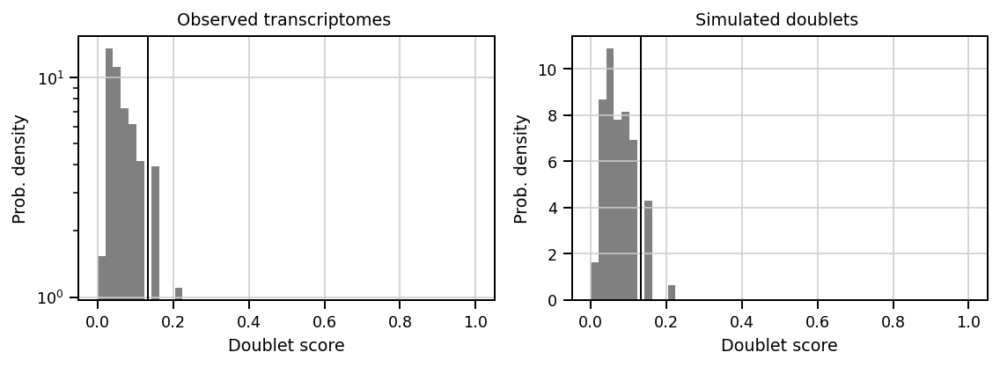

In [26]:
sb.set_context('paper')
savefig=samplename + '_7_QC_doublets.pdf'
sce.pl.scrublet_score_distribution(adata4,save=savefig)

In [27]:
adata4 = adata4[adata4.obs.predicted_doublet == False]
adata4

View of AnnData object with n_obs × n_vars = 200 × 36601
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types'
    uns: 'scrublet'

# Data Integration 

In [28]:
adata=adata1.concatenate(adata1,adata2,adata3,adata4, join = "inner")#keep all common ones; 
adata


#outer join- only keep genes that are uncommon , use inner in raw data not cleanup data 

AnnData object with n_obs × n_vars = 26740 × 36601
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet', 'batch'
    var: 'gene_ids', 'feature_types'

Let's remove all genes expressed in fewer than 5 cells:

In [29]:
sc.pp.filter_genes(adata, min_cells=5)
adata

AnnData object with n_obs × n_vars = 26740 × 26166
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet', 'batch'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [30]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

# compute qc metrics

adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
adata.var['rb'] = adata.var_names.str.startswith(('RPS','RPL'))  # annotate the group of ribosomal proteins as 'rb'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

adata

AnnData object with n_obs × n_vars = 26740 × 26166
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet', 'batch', 'n_counts', 'log_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

# Helper plots for determining gene and count threshold values

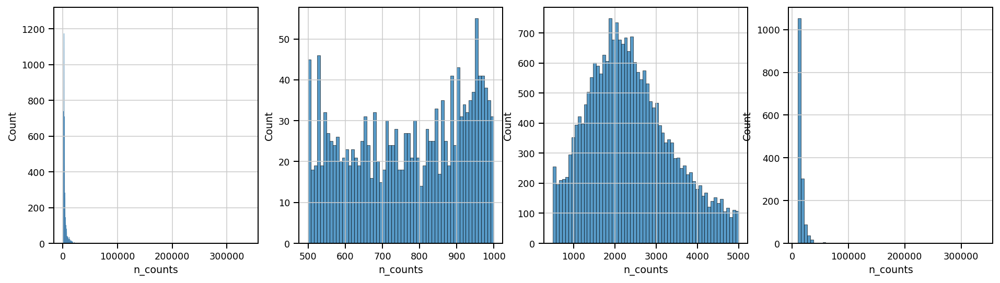

In [31]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3,ax4) = plt.subplots(1, 4, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(adata.obs['n_counts'], kde=False, ax=ax1,)
ax2_dict =  sb.histplot(adata.obs['n_counts'][adata.obs['n_counts']<1000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(adata.obs['n_counts'][adata.obs['n_counts']<5000], kde=False, bins=60, ax=ax3,)
ax4_dict = sb.histplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60, ax=ax4, )
savefig='figures/'+samplename + '_1_QC_counts_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

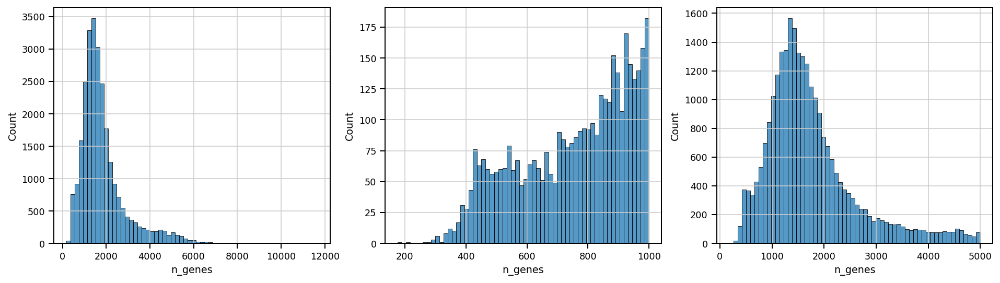

In [32]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(adata.obs['n_genes'], kde=False, bins=60, ax=ax1,)
ax2_dict =  sb.histplot(adata.obs['n_genes'][adata.obs['n_genes']<1000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(adata.obs['n_genes'][adata.obs['n_genes']<5000], kde=False, bins=60, ax=ax3,)
savefig='figures/'+samplename + '_2_QC_gene_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

Plot correlations and make sure that high mitochondrial content corresponds with low total counts (dead cells), and that total counts have strong positive correlation with the number of expressed genes:

... storing 'sample' as categorical
... storing 'group' as categorical
... storing 'feature_types' as categorical


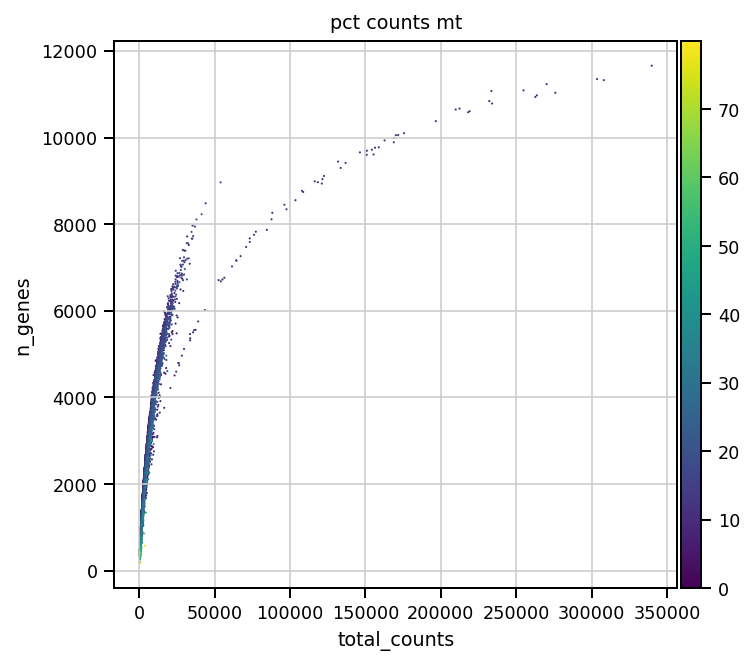

In [33]:
# plot percentage of mitochondtial genes versus count depth and n_genes
sb.set_context('paper')
pl.rcParams['figure.figsize']=(5,5) #rescale figures
savefig=samplename + '_4_QC_saturationplot.pdf'
sc.pl.scatter(adata, x='total_counts', y='n_genes', color='pct_counts_mt',save=savefig)

Filter outliers cells with >150,000 couts

In [34]:
adata.obs

,sample,group,doublet_score,predicted_doublet,batch,n_counts,log_counts,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_rb,pct_counts_rb
AAACAGCCAAACGCGA-1-0,Cellline3,JT,0.055249,False,0,1178.0,7.071573,884,884,1178.0,75.0,6.366723,70.0,5.942275
AAACAGCCAGCCTGCA-1-0,Cellline3,JT,0.160883,False,0,1702.0,7.439559,1217,1217,1702.0,124.0,7.285546,122.0,7.168037
AAACAGCCATTGCGTA-1-0,Cellline3,JT,0.238307,False,0,4435.0,8.397283,2597,2597,4435.0,285.0,6.426156,287.0,6.471251
AAACAGCCATTGGGAG-1-0,Cellline3,JT,0.160883,False,0,2002.0,7.601902,1291,1291,2002.0,221.0,11.038961,125.0,6.243756
AAACATGCAAGGTACG-1-0,Cellline3,JT,0.041284,False,0,2506.0,7.826443,1655,1655,2506.0,178.0,7.102953,130.0,5.187550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTCAAAGGGTCTAT-1-4,Cellline2,CS,0.039326,False,4,7701.0,8.949105,2802,2802,7701.0,529.0,6.869238,1850.0,24.022856
TTGTGAGGTTAATGCG-1-4,Cellline2,CS,0.056738,False,4,3737.0,8.226038,1701,1701,3737.0,286.0,7.653198,896.0,23.976452
TTTCTTGCACGTTACA-1-4,Cellline2,CS,0.056738,False,4,12178.0,9.407387,3112,3112,12178.0,1163.0,9.550008,3291.0,27.024141
TTTGACTTCTAATCCT-1-4,Cellline2,CS,0.056738,False,4,26274.0,10.176335,4797,4797,26274.0,2578.0,9.811982,7081.0,26.950598


In [35]:
sc.pp.filter_cells(adata, max_counts = 150000)
print('Number of cells after max count filter: {:d}'.format(adata.n_obs))

Number of cells after max count filter: 26712


High ribosomal protein content can correlate inversly with  with MT, and may contain biological information.( Do not apply to snRNASeq. Why?)

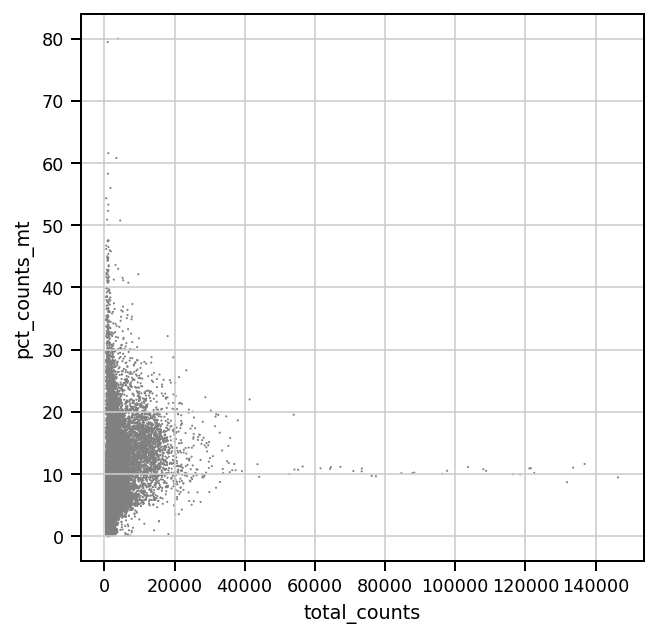

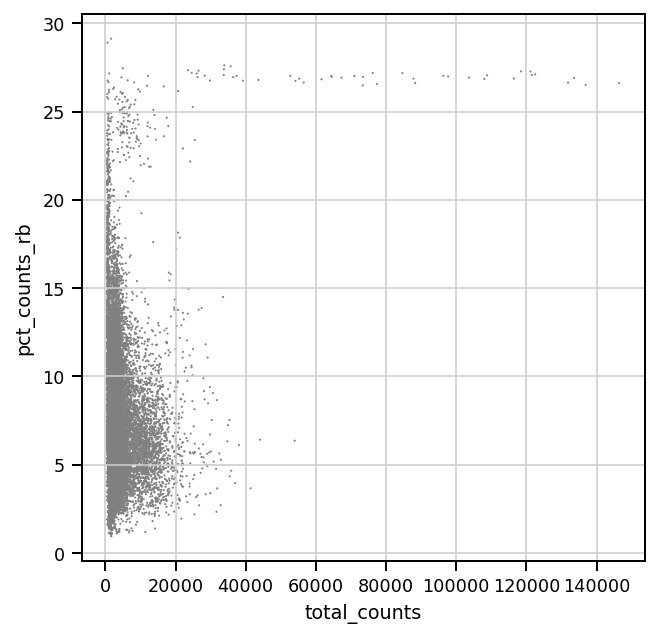

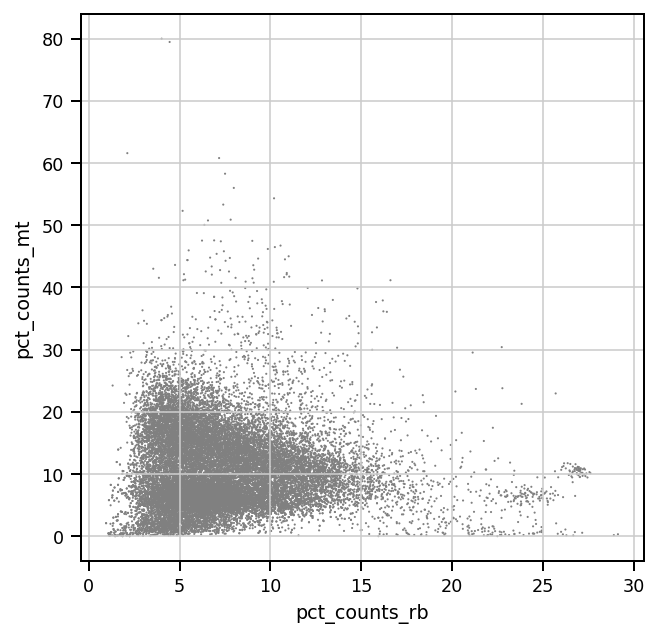

In [36]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(5,5) #rescale figures
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='pct_counts_rb')
sc.pl.scatter(adata, x='pct_counts_rb', y='pct_counts_mt')

A violin plot of the computed quality measures can help us analyze the dataset in general and make decisions about cutoffs.

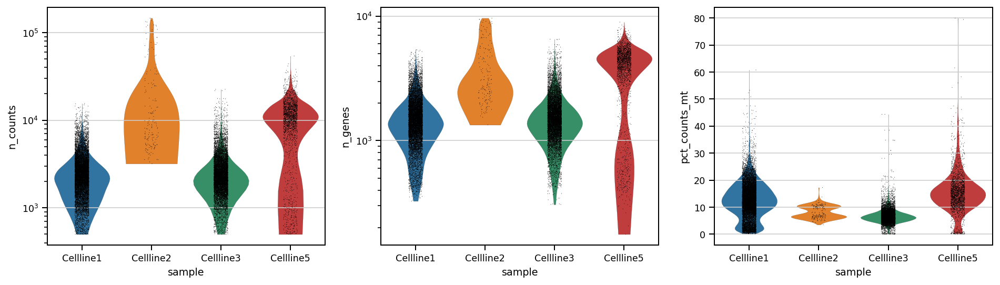

In [37]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})
#group by group / sample 
ax1_dict = sc.pl.violin(adata, 'n_counts', groupby='sample', size=0.5, log=True, cut=0, ax=ax1, show=False)
ax2_dict =  sc.pl.violin(adata, 'n_genes', groupby='sample', size=0.5, log=True, cut=0, ax=ax2, show=False)
ax3_dict = sc.pl.violin(adata, 'pct_counts_mt', groupby='sample',size=0.5, ax=ax3, show=False,)
savefig='figures/'+samplename + '_5_QC_violin_plots.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

Let's show those genes that yield the highest fraction of counts in each single cell, across all cells.

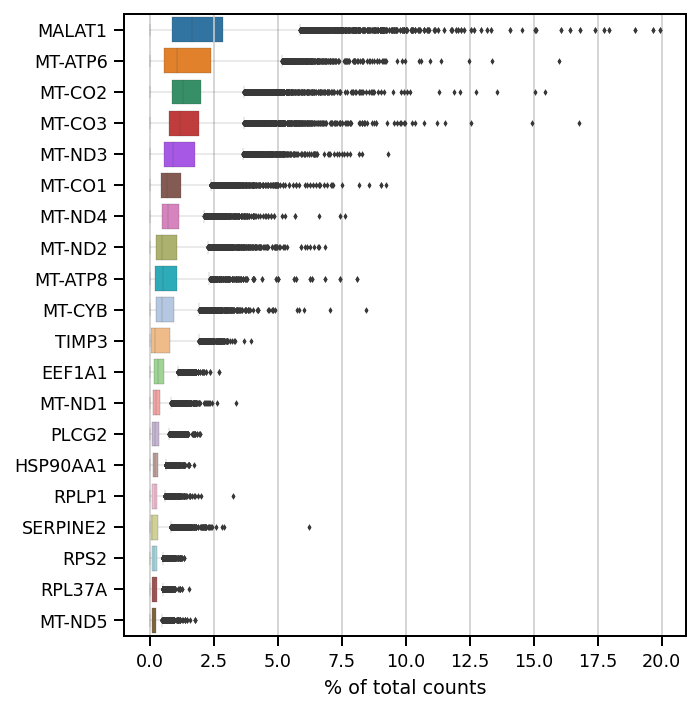

In [38]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
savefig='_'+samplename + '_6_QC_highest_expr_genes.pdf'
sc.pl.highest_expr_genes(adata, n_top=20,save=savefig,)

In [39]:
print(adata.obs['group'].value_counts())

CL2    12864
JT     11466
SH      2210
CS       172
Name: group, dtype: int64


In [40]:
adata.obs['n_counts'].sum()/adata.obs['group'].value_counts()

CL2      7486.049129
JT       8398.790860
SH      43574.903167
CS     559886.837209
Name: group, dtype: float64

In [41]:
adata.obs['n_counts'].sum()

96300536.0

# Interactive filtering

In [42]:
def h(counts=400, genes=400,mito=15):
    conditions = [(adata.obs['predicted_doublet'] == True),(adata.obs['n_genes_by_counts'] < counts),(adata.obs['n_genes'] < genes),(adata.obs['pct_counts_mt'] >mito),(adata.obs['pct_counts_mt'] <= mito) & (adata.obs['n_genes_by_counts'] >= counts) & (adata.obs['n_genes'] >= genes)& (adata.obs['predicted_doublet'] != True)]
    values = ['Doublet', 'Low_nFeature', 'Low_ngenes','High_MT', 'Passing']
    adata.obs['QC'] = np.select(conditions, values)
    adata.obs['QC'] = adata.obs['QC'].astype('category')

    new_df1=pd.DataFrame(adata.obs['QC'].value_counts()).reset_index()
    p=sb.barplot(x='index',y='QC',data=new_df1,color='sandybrown')
    show_values(p)


interactive_plot = interactive(h, counts=(0, 2000,20), genes=(0, 2000,20), mito=(0, 100, 1))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(IntSlider(value=400, description='counts', max=2000, step=20), IntSlider(value=400, desc…

In [43]:
adata.obs['QC'].value_counts()

Passing         21103
High_MT          5512
Low_nFeature       97
Name: QC, dtype: int64

## Plot QC for cells that pass tentative thresholds

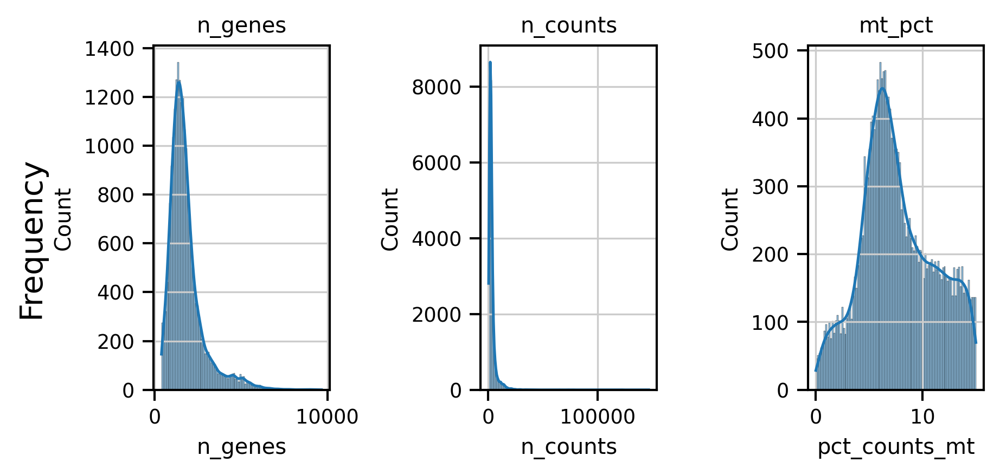

In [44]:

sb.set_context('paper')


fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(6, 3), dpi=150, sharey=False)
adata.obs['n_genes']

sb.histplot( adata[adata.obs['QC'] == 'Passing'].obs['n_genes'], ax=ax1, kde=True, bins=100)
sb.histplot( adata[adata.obs['QC'] == 'Passing'].obs['n_counts'], ax=ax2, kde=True, bins=100)
sb.histplot(adata[adata.obs['QC'] == 'Passing'].obs['pct_counts_mt'], ax=ax3, kde=True, bins=100)

ax1.title.set_text('n_genes')
ax2.title.set_text('n_counts')
ax3.title.set_text('mt_pct')

fig.text(0.00, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')

fig.tight_layout()
savefig='figures/'+samplename + '_3_QC_filtering_postfilter.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

# PART 2. Normalization and dimensionality reduction.

Squre root of total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells. The data are also log-transformed with a pseudocount of 1. Transformed data is stored in 'sqrt_norm' layer

In [45]:
adata.layers["raw"] = adata.X 
adata.raw=adata
adata.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(adata, inplace=False)["X"])

pearson residuals normalization used for Dimention reduction, stored in normalized

The comand will :
 * Calculate pearson residuals for each gene 
 * Identify highly-variable genes to prioritize in further analysis.
 * Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [46]:
sc.experimental.pp.recipe_pearson_residuals(adata,n_top_genes=3000,n_comps=100,random_state=42,inplace=True)
adata.layers["normalized"]=adata.X



Plot the highly variable genes, after the normalization.

In [47]:
adata.obs

,sample,group,doublet_score,predicted_doublet,batch,n_counts,log_counts,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_rb,pct_counts_rb,QC
AAACAGCCAAACGCGA-1-0,Cellline3,JT,0.055249,False,0,1178.0,7.071573,884,884,1178.0,75.0,6.366723,70.0,5.942275,Passing
AAACAGCCAGCCTGCA-1-0,Cellline3,JT,0.160883,False,0,1702.0,7.439559,1217,1217,1702.0,124.0,7.285546,122.0,7.168037,Passing
AAACAGCCATTGCGTA-1-0,Cellline3,JT,0.238307,False,0,4435.0,8.397283,2597,2597,4435.0,285.0,6.426156,287.0,6.471251,Passing
AAACAGCCATTGGGAG-1-0,Cellline3,JT,0.160883,False,0,2002.0,7.601902,1291,1291,2002.0,221.0,11.038961,125.0,6.243756,Passing
AAACATGCAAGGTACG-1-0,Cellline3,JT,0.041284,False,0,2506.0,7.826443,1655,1655,2506.0,178.0,7.102953,130.0,5.187550,Passing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTCAAAGGGTCTAT-1-4,Cellline2,CS,0.039326,False,4,7701.0,8.949105,2802,2802,7701.0,529.0,6.869238,1850.0,24.022856,Passing
TTGTGAGGTTAATGCG-1-4,Cellline2,CS,0.056738,False,4,3737.0,8.226038,1701,1701,3737.0,286.0,7.653198,896.0,23.976452,Passing
TTTCTTGCACGTTACA-1-4,Cellline2,CS,0.056738,False,4,12178.0,9.407387,3112,3112,12178.0,1163.0,9.550008,3291.0,27.024141,Passing
TTTGACTTCTAATCCT-1-4,Cellline2,CS,0.056738,False,4,26274.0,10.176335,4797,4797,26274.0,2578.0,9.811982,7081.0,26.950598,Passing


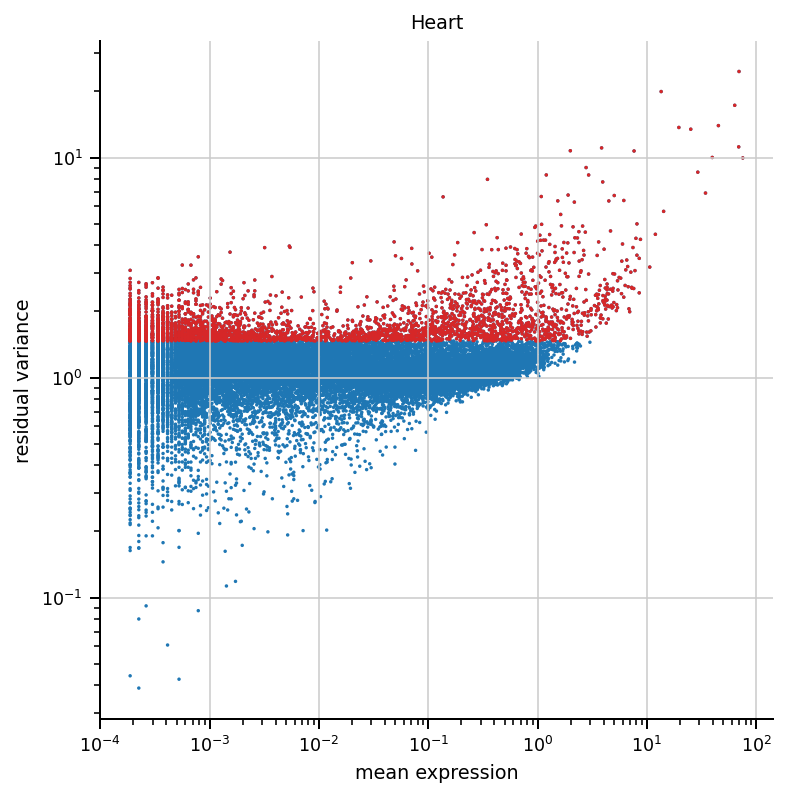

In [48]:
#markers = ["IL7R","LYZ","CD14","MS4A1","CD8A","GNLY","NKG7","FCGR3A","MS4A7","FCER1A","CST3","PPBP",]
markers = ["Th"]
hvgs = adata.var["highly_variable"]
fig, ax = plt.subplots(figsize=(6, 6))
pl.scatter(
        adata.var["mean_counts"], adata.var["residual_variances"], s=3, edgecolor="none"
    )
pl.scatter(
        adata.var["mean_counts"][hvgs],
        adata.var["residual_variances"][hvgs],
        c="tab:red",
        label="selected genes",
        s=3,
        edgecolor="none",
    )
pl.scatter(
        adata.var["mean_counts"][np.isin(adata.var_names, markers)],
        adata.var["residual_variances"][np.isin(adata.var_names, markers)],
        c="k",
        label="known marker genes",
        s=10,
        edgecolor="black",
    )
ax.set_xscale("log")
ax.set_xlabel("mean expression")
ax.set_yscale("log")
ax.set_ylabel("residual variance")
ax.set_title(samplename)

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")

# cellcycle score

 Let's calculate cell cycle scores, as described [here](https://nbviewer.jupyter.org/github/theislab/scanpy_usage/blob/master/180209_cell_cycle/cell_cycle.ipynb). 

It is important to note that cell cycle analysis has to be done after normalization 

In [49]:
s_genes = ['MCM5','PCNA','TYMS','FEN1','MCM7','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1',
           'UHRF1','CENPU','HELLS','RFC2','POLR1B','NASP','RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7',
           'POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
           'USP1','CLSPN','POLA1','CHAF1B','MRPL36','E2F8']
g2m_genes = ['HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B',
             'MKI67','TMPO','CENPF','TACC3','PIMREG','SMC4','CCNB2','CKAP2L','CKAP2','AURKB','BUB1',
             'KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','CDCA3','JPT1','CDC20','TTK','CDC25C',
             'KIF2C','RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1',
             'ANLN','LBR','CKAP5','CENPE','CTCF','NEK2','G2E3','GAS2L3','CBX5','CENPA']
cell_cycle_genes = s_genes + g2m_genes
display(len(s_genes))
display(len(g2m_genes))
display(len(cell_cycle_genes))

43

54

97

In [50]:
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
len(cell_cycle_genes)

97

In [51]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

... storing 'phase' as categorical


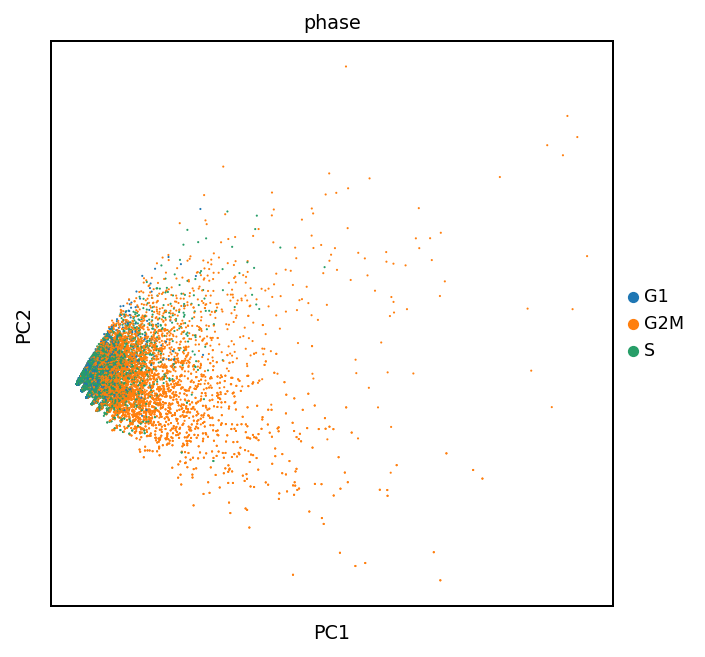

In [52]:
adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color='phase')

# PCA (Ploting only)

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often, a rough estimate of the number of PCs does fine.

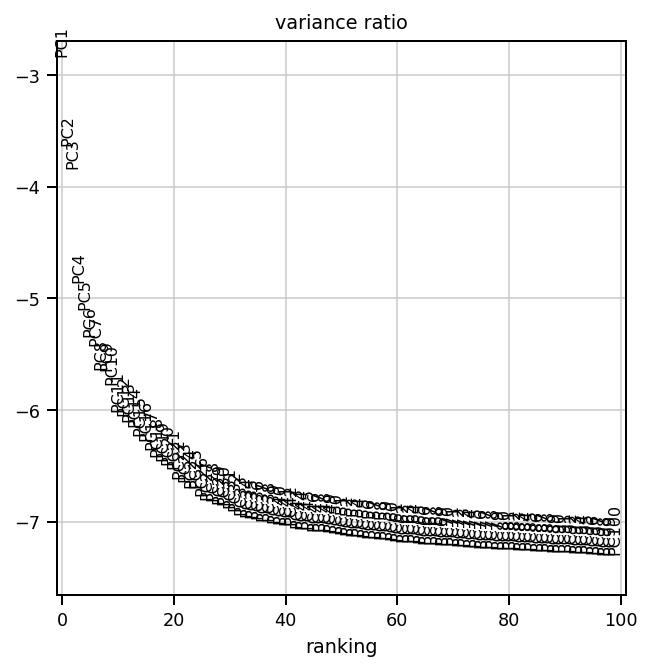

In [53]:
#sc.pp.pca(adata, n_comps = 100, use_highly_variable =False, svd_solver = "arpack")
sc.pl.pca_variance_ratio(adata, n_pcs = 100,log=True)

UMAP and tSNE are popular methods used for dimensionality reduction and visualisation of very large datasets. UMAP is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories.

Plot the data with UMAP, with coloring according to clustering. Some larger clusters are clearly identifiable as cell populations. Other smaller clusters can be attributed to doublets, cell cycle artefacts, etc.

... storing 'phase' as categorical


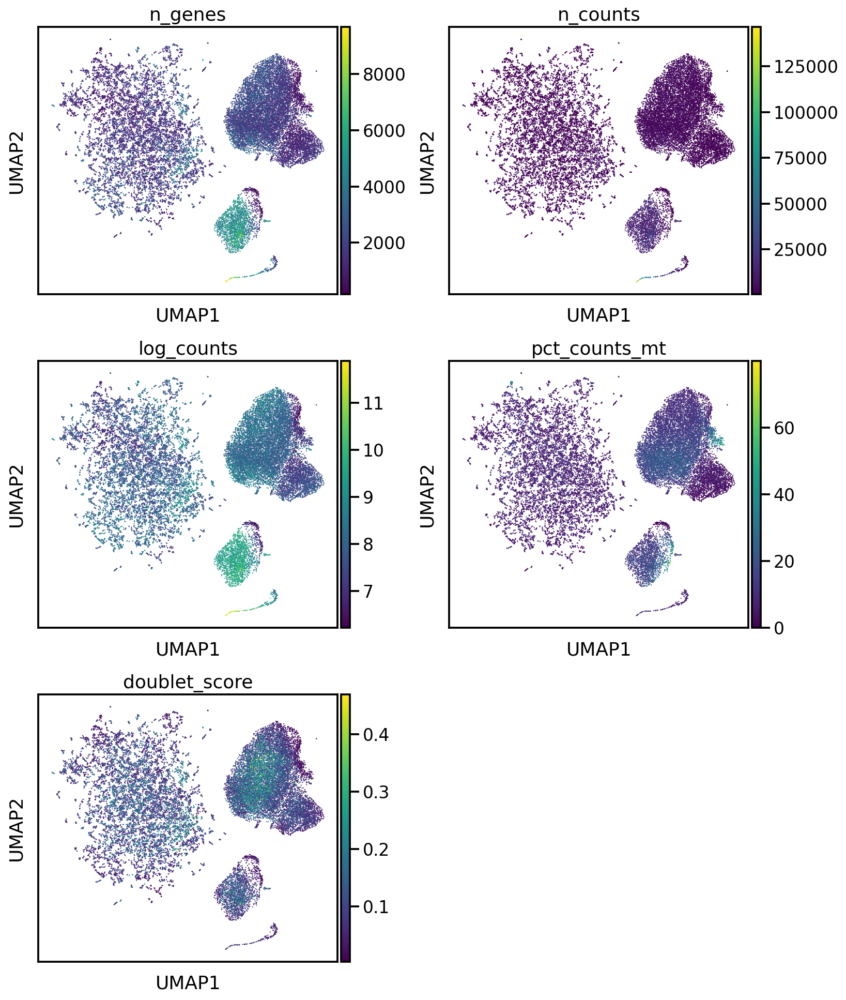

In [54]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
sc.pp.neighbors(adata, n_pcs=50,n_neighbors=10,random_state=42)

genes_to_plot = ['n_genes','n_counts','log_counts','pct_counts_mt','doublet_score']
sc.tl.umap(adata)
savefig=samplename+"_4_QC_doublets_vst_mito.pdf"
sc.pl.umap(adata, color = genes_to_plot,ncols=2,wspace=0.25, save=savefig)

Let's remove the cells that did not pass QC and compare plots. We can now see much more defined clusters. 

In [55]:
adata

AnnData object with n_obs × n_vars = 26712 × 26166
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet', 'batch', 'n_counts', 'log_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable'
    uns: 'sample_colors', 'hvg', 'pca', 'pearson_residuals_normalization', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw', 'sqrt_norm', 'normalized'
    obsp: 'distances', 'connectivities'

In [56]:
adata = adata[adata.obs['QC'] == 'Passing']
adata

View of AnnData object with n_obs × n_vars = 21103 × 26166
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet', 'batch', 'n_counts', 'log_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable'
    uns: 'sample_colors', 'hvg', 'pca', 'pearson_residuals_normalization', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw', 'sqrt_norm', 'normalized'
    obsp: 'distances', 'connectivities'

Our filtered dataset now contains 2036 cells, only 13 cells were removed!

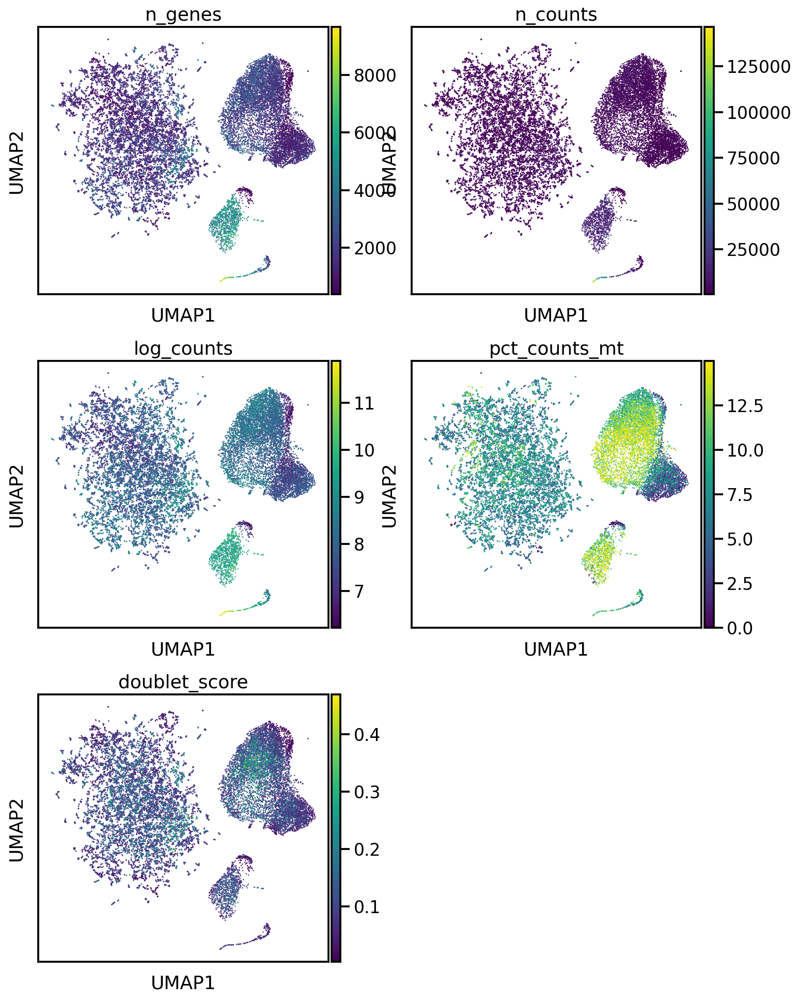

In [57]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
savefig=samplename+"_4_QC_doublets_vst_mito.pdf"
sc.pl.umap(adata, color = genes_to_plot,ncols=2,layer='counts',save=savefig)

# PART 3. Normalization and careful clustering of the cleaned dataset.

Let's restart our analysis from the counts matrix again

In [58]:
adata.X=adata.layers['raw']

Let's redo HVG, PCA, UMAP, and clustering analysis, since now we have QC-filtered cells.

In [59]:
#HVG
sc.experimental.pp.highly_variable_genes(adata, flavor="pearson_residuals", n_top_genes=2000)

/opt/conda/lib/python3.9/site-packages/scanpy/experimental/pp/_highly_variable_genes.py:67: UserWarning: Received a view of an AnnData. Making a copy.


In [60]:
# Nomalization
sc.experimental.pp.normalize_pearson_residuals(adata,inplace=True)
adata.layers["normalized"]=adata.X

/opt/conda/lib/python3.9/site-packages/scanpy/experimental/pp/_normalization.py:59: RuntimeWarning: invalid value encountered in true_divide


In [61]:
#PCA
sc.pp.pca(adata, n_comps=50,random_state=42)

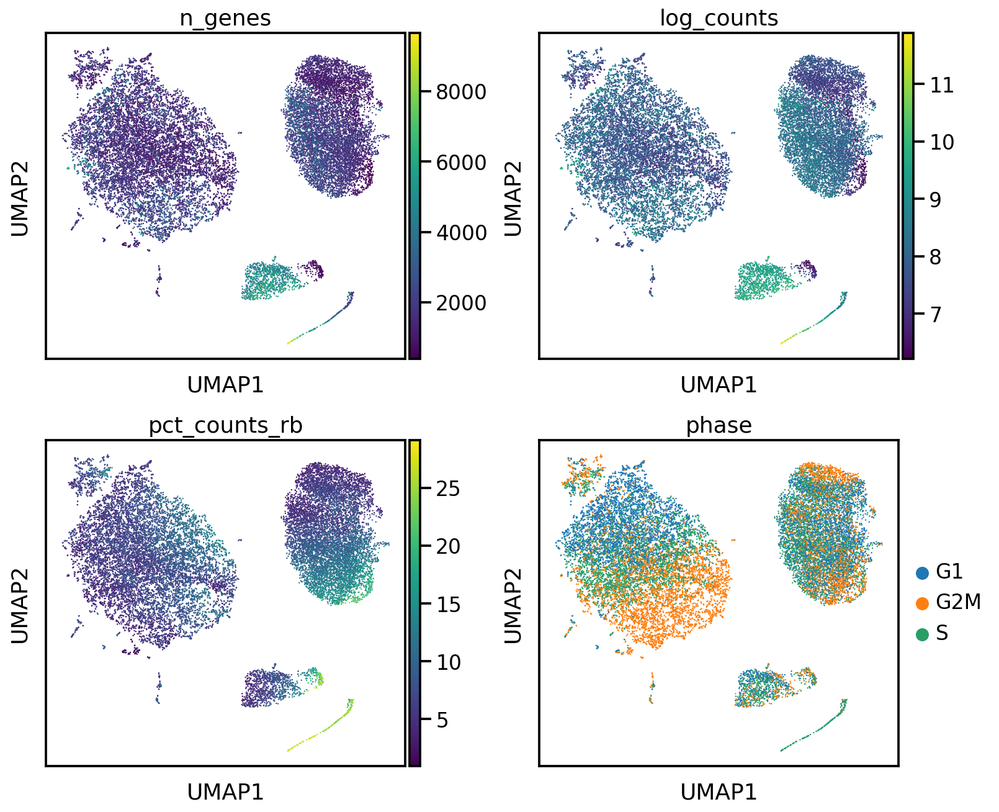

In [62]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
sc.pp.neighbors(adata, n_pcs=50,n_neighbors=15,random_state=42)

genes_to_plot = ['n_genes','log_counts','pct_counts_rb','phase']

sc.tl.umap(adata,random_state=42)
savefig=samplename+"_4_QC_doublets_vst_mito.pdf"
sc.pl.umap(adata,wspace=0.25, color = genes_to_plot,ncols=2,save=savefig)

In [63]:
%%capture
sc.tl.leiden(adata,random_state=random_state,resolution=1.5, key_added='leiden_r1.5')
sc.tl.leiden(adata,random_state=random_state,resolution=1, key_added='leiden_r1')
sc.tl.leiden(adata,random_state=random_state, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata,random_state=random_state, resolution=0.5, key_added='leiden_r0.5')
sc.tl.leiden(adata,random_state=random_state, resolution=0.4, key_added='leiden_r0.4')
sc.tl.leiden(adata,random_state=random_state, resolution=0.3, key_added='leiden_r0.3')
sc.tl.leiden(adata,random_state=random_state, resolution=0.2, key_added='leiden_r0.2')

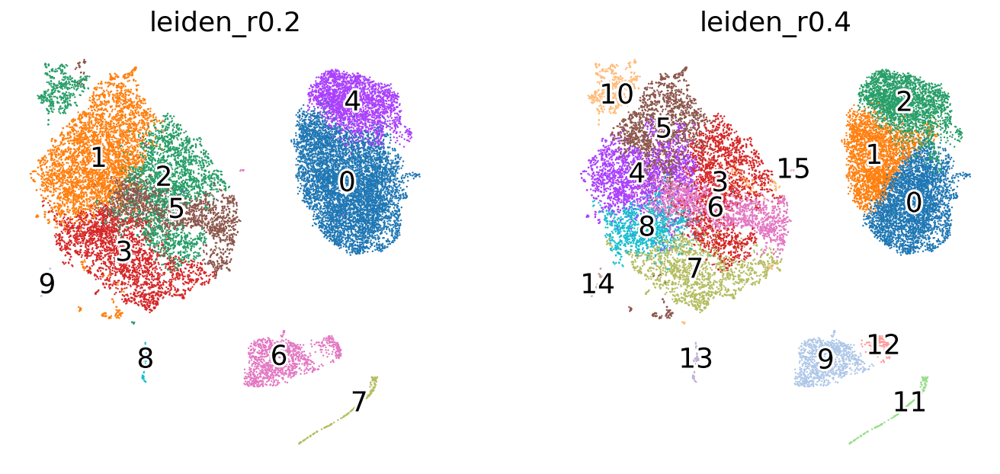

In [64]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_lores_vst.pdf"
sc.pl.umap(adata, color=['leiden_r0.2','leiden_r0.4'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

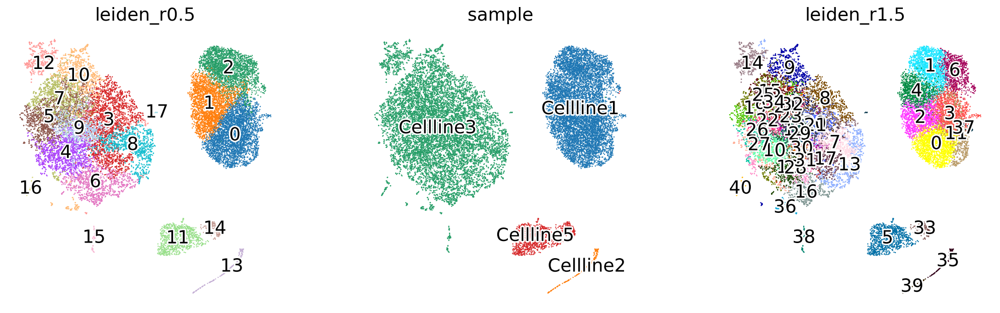

In [65]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_hires_vst.pdf"
sc.pl.umap(adata, color=['leiden_r0.5','sample','leiden_r1.5'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

If UMAP looks slightly less than perfect, we can use the following trick from the `scanpy` tutorial page:

In [66]:
sc.tl.paga(adata,groups='sample')
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga')

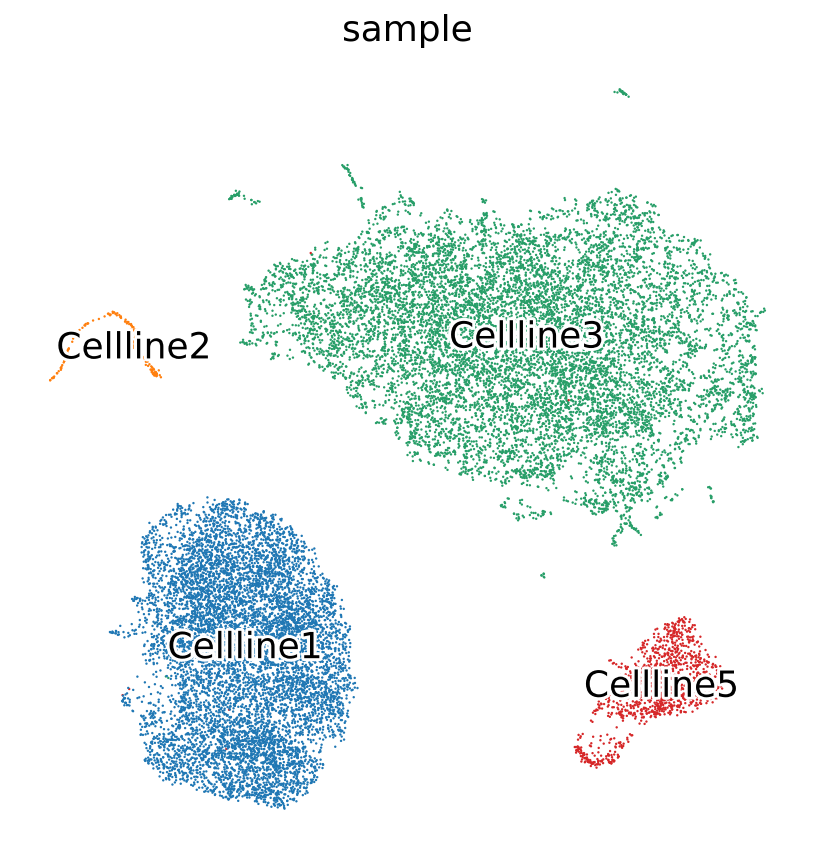

In [67]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
savefig=samplename+"_5_clustering_vst_lowres.pdf"
sc.pl.umap(adata, color=['sample',],ncols=3, legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

# PART 4. Differential expression and marker selection.

After we have fixed the clusters, let's make gene markers using Wilcoxon test. Score plotting for each cluster allows to estimate the relative information of a marker in a quick fashion.

# Marker genes

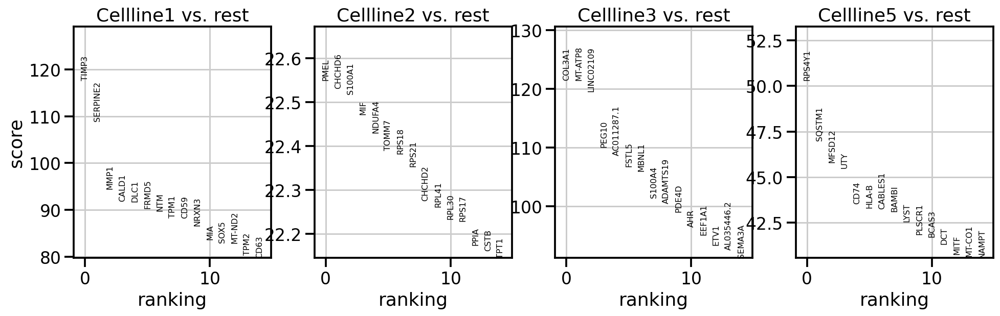

In [68]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(4,4)
sc.tl.rank_genes_groups(adata, 'sample', method='wilcoxon',layer='sqrt_norm',key_added = "wilcoxon",use_raw=False)
sc.pl.rank_genes_groups(adata, n_genes=15,key="wilcoxon", sharey=False)

lets get a table with the marker genes 

In [69]:
#method : {‘logreg’, ‘t-test’, ‘wilcoxon’, ‘t-test_overestim_var’} | None (default: None)
sc.tl.rank_genes_groups(adata, 'sample', method='wilcoxon',n_genes=adata.shape[1],layer='sqrt_norm',key_added = "wilcoxon",use_raw=False)
markers=pd.DataFrame(adata.uns['wilcoxon']['names']).head(20)
markers

,Cellline1,Cellline2,Cellline3,Cellline5
0,TIMP3,PMEL,COL3A1,RPS4Y1
1,SERPINE2,CHCHD6,MT-ATP8,SQSTM1
2,MMP1,S100A1,LINC02109,MFSD12
3,CALD1,MIF,PEG10,UTY
4,DLC1,NDUFA4,AC011287.1,CD74
5,FRMD5,TOMM7,FSTL5,HLA-B
6,NTM,RPS18,MBNL1,CABLES1
7,TPM1,RPS21,S100A4,BAMBI
8,CD59,CHCHD2,ADAMTS19,LYST
9,NRXN3,RPL41,PDE4D,PLSCR1


In [70]:
markers.to_csv('cellline.csv')

Lets visualize some markers genes

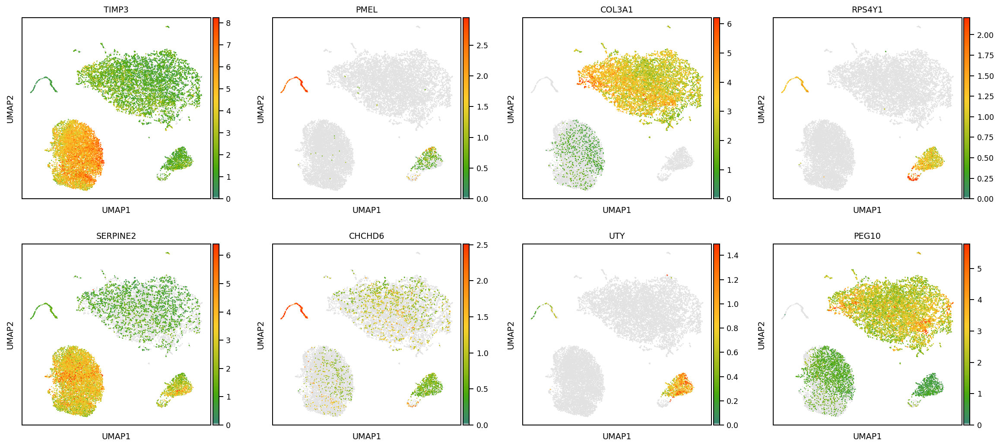

In [71]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
savefig=samplename+"_10_markers_1.pdf"
sc.pl.umap(adata=adata, color=['TIMP3','PMEL','COL3A1','RPS4Y1','SERPINE2','CHCHD6','UTY','PEG10'],color_map=mymap,vmin='p20', vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False,layer="sqrt_norm", save=savefig)

# Manual Annotation



 Using [panglaodb](https://panglaodb.se/search.html).  and other tools like [enrichR](https://maayanlab.cloud/Enrichr/) annotated the cluster

In [72]:
adata.obs['annotated'] = adata.obs['sample'].cat.add_categories([ "Dendritic Cells"])
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['3','1'])] = 'Dendritic Cells'


adata.obs['annotated'] = adata.obs['annotated'].cat.remove_unused_categories()

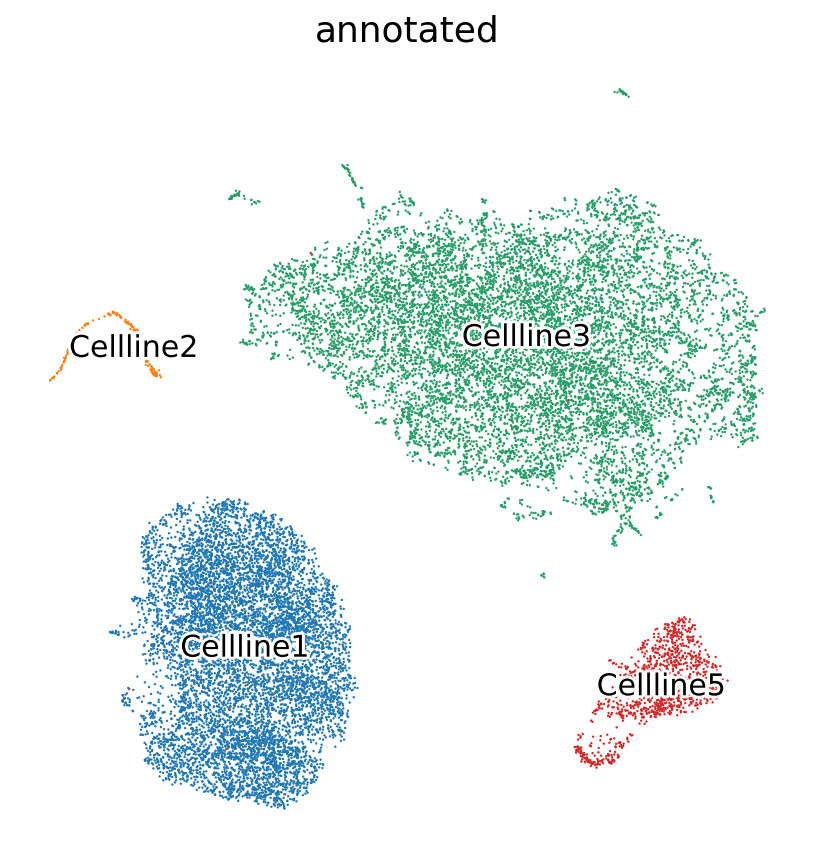

In [73]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_annotated_hires_annotated.pdf"
sc.pl.umap(adata, color=['annotated'], legend_loc='on data',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False,save=savefig)

#sample composition

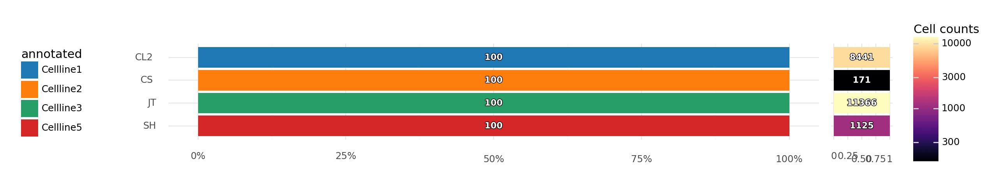

In [74]:
 fig=plot_proportion_barplot_with_ncells(
    adata,
    'group',
    fill='annotated', 
    fill_breakdown=None,
    yaxis_label=None,
    fill_label='annotated',
    percent_limit=1., 
    show_percent=True,
    height_scale=1., 
    width_scale=1.,
    legend_position=(-0, 0.5),
    normalize_by=None,)
fig.savefig('cell_composition_by_FOV.pdf', dpi=300, bbox_inches='tight')

# pooled analysis 



In [75]:
final = sc.read_10x_mtx(data_dir + "Mix7_outs/filtered_feature_bc_matrix/",cache = True)
final

AnnData object with n_obs × n_vars = 4225 × 36601
    var: 'gene_ids', 'feature_types'

In [76]:
final.var_names_make_unique()
final
final.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.5', 'AL627309.4', 'AP006222.2', 'AL732372.1',
       ...
       'AC133551.1', 'AC136612.1', 'AC136616.1', 'AC136616.3', 'AC136616.2',
       'AC141272.1', 'AC023491.2', 'AC007325.1', 'AC007325.4', 'AC007325.2'],
      dtype='object', length=36601)

In [77]:
final.obs.head()

""
AAACAGCCAAACTGTT-1
AAACAGCCAAGGACCA-1
AAACATGCAAGGATTA-1
AAACATGCAGTAGGTG-1
AAACCAACAAGATTCT-1


In [78]:
final.obs['sample']=[samplename]*final.n_obs
final.obs['group']=['12G']*final.n_obs

In [79]:
sc.pp.filter_genes(final, min_cells=5)
final

AnnData object with n_obs × n_vars = 4225 × 21570
    obs: 'sample', 'group'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [80]:
sce.pp.scrublet(final,expected_doublet_rate = 0.010,threshold=None)

/opt/conda/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.


Automatically set threshold at doublet score = 0.17
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 5.3%
Overall doublet rate:
	Expected   = 1.0%
	Estimated  = 6.7%


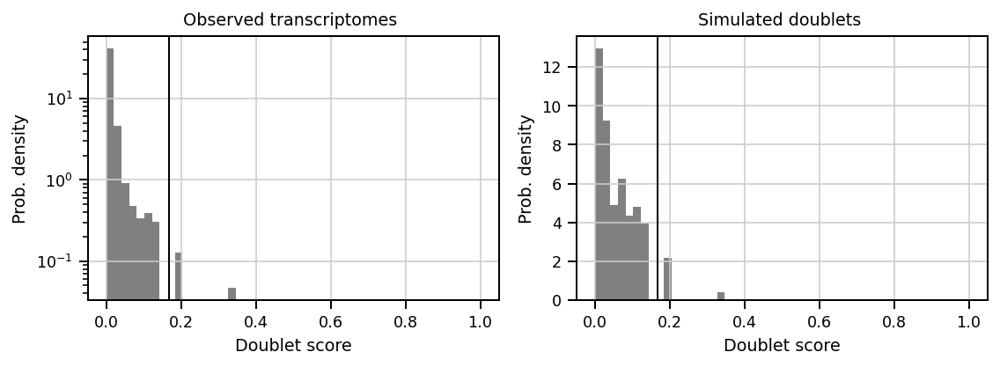

In [81]:
sb.set_context('paper')
savefig=samplename + '_7_QC_doublets.pdf'
sce.pl.scrublet_score_distribution(final,save=savefig)

In [82]:
final.obs

,sample,group,doublet_score,predicted_doublet
AAACAGCCAAACTGTT-1,Heart,12G,0.014533,False
AAACAGCCAAGGACCA-1,Heart,12G,0.011318,False
AAACATGCAAGGATTA-1,Heart,12G,0.025231,False
AAACATGCAGTAGGTG-1,Heart,12G,0.013793,False
AAACCAACAAGATTCT-1,Heart,12G,0.002118,False
...,...,...,...,...
TTTGTGTTCCGGAACC-1,Heart,12G,0.003471,False
TTTGTTGGTTGCACAA-1,Heart,12G,0.011874,False
TTTGTTGGTTTAGCTC-1,Heart,12G,0.004825,False
TTTGTTGGTTTGAGCA-1,Heart,12G,0.015334,False


In [83]:
# Quality control - calculate QC covariates
final.obs['n_counts'] = final.X.sum(1)
final.obs['log_counts'] = np.log(final.obs['n_counts'])
final.obs['n_genes'] = (final.X > 0).sum(1)

# compute qc metrics

final.var['mt'] = final.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
final.var['rb'] = final.var_names.str.startswith(('RPS','RPL'))  # annotate the group of ribosomal proteins as 'rb'
sc.pp.calculate_qc_metrics(final, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(final, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

final

AnnData object with n_obs × n_vars = 4225 × 21570
    obs: 'sample', 'group', 'doublet_score', 'predicted_doublet', 'n_counts', 'log_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'scrublet'

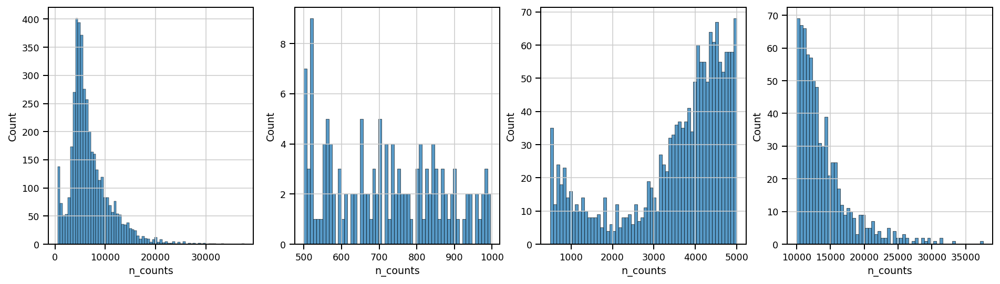

In [84]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3,ax4) = plt.subplots(1, 4, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(final.obs['n_counts'], kde=False, ax=ax1,)
ax2_dict =  sb.histplot(final.obs['n_counts'][final.obs['n_counts']<1000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(final.obs['n_counts'][final.obs['n_counts']<5000], kde=False, bins=60, ax=ax3,)
ax4_dict = sb.histplot(final.obs['n_counts'][final.obs['n_counts']>10000], kde=False, bins=60, ax=ax4, )
savefig='figures/'+samplename + '_1_QC_counts_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

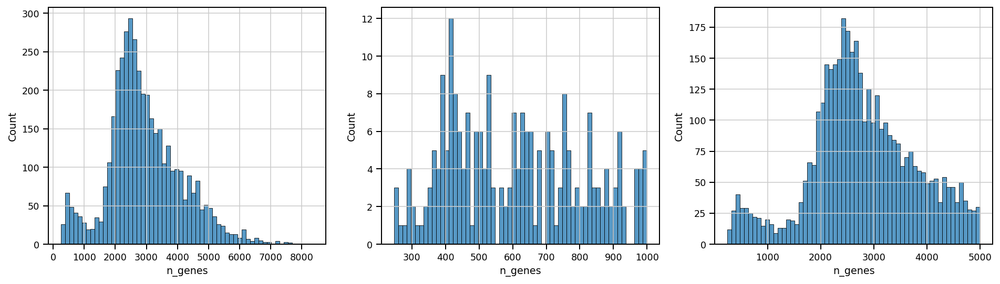

In [85]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(final.obs['n_genes'], kde=False, bins=60, ax=ax1,)
ax2_dict =  sb.histplot(final.obs['n_genes'][final.obs['n_genes']<1000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(final.obs['n_genes'][final.obs['n_genes']<5000], kde=False, bins=60, ax=ax3,)
savefig='figures/'+samplename + '_2_QC_gene_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

... storing 'sample' as categorical
... storing 'group' as categorical
... storing 'feature_types' as categorical


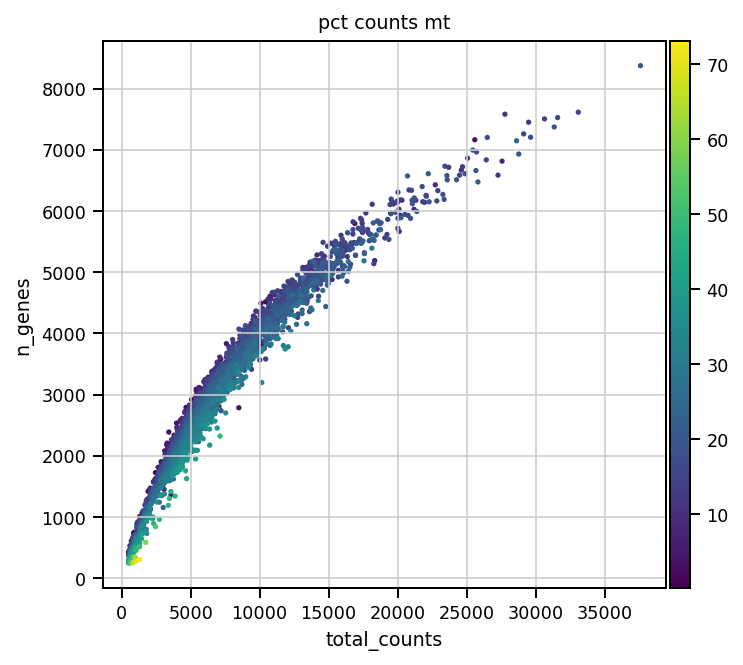

In [86]:
# plot percentage of mitochondtial genes versus count depth and n_genes
sb.set_context('paper')
pl.rcParams['figure.figsize']=(5,5) #rescale figures
savefig=samplename + '_4_QC_saturationplot.pdf'
sc.pl.scatter(final, x='total_counts', y='n_genes', color='pct_counts_mt',save=savefig)

In [87]:
sc.pp.filter_cells(adata, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(final.n_obs))

Number of cells after max count filter: 4225


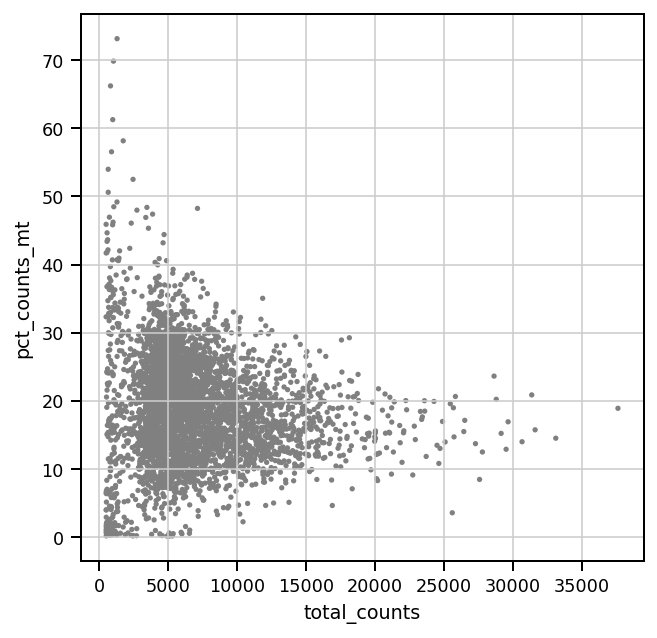

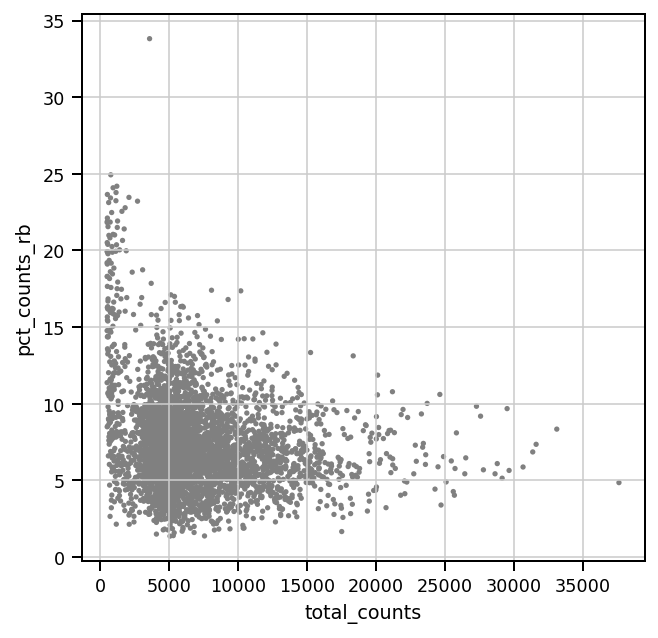

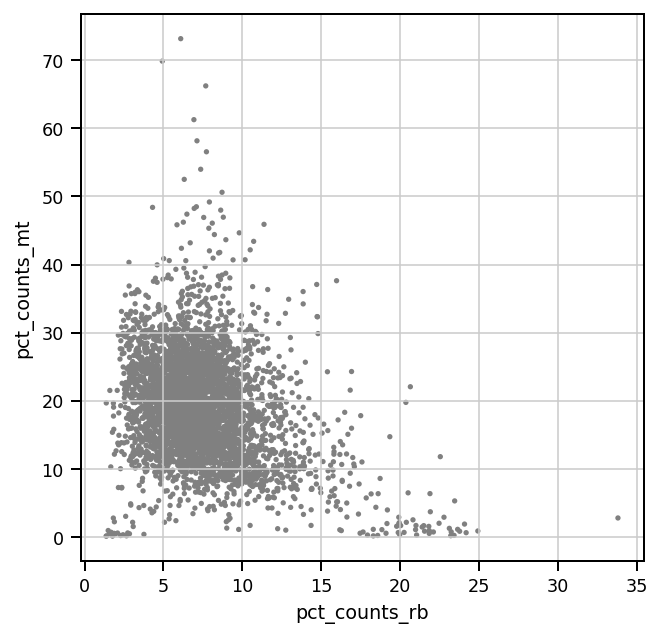

In [88]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(5,5) #rescale figures
sc.pl.scatter(final, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(final, x='total_counts', y='pct_counts_rb')
sc.pl.scatter(final, x='pct_counts_rb', y='pct_counts_mt')

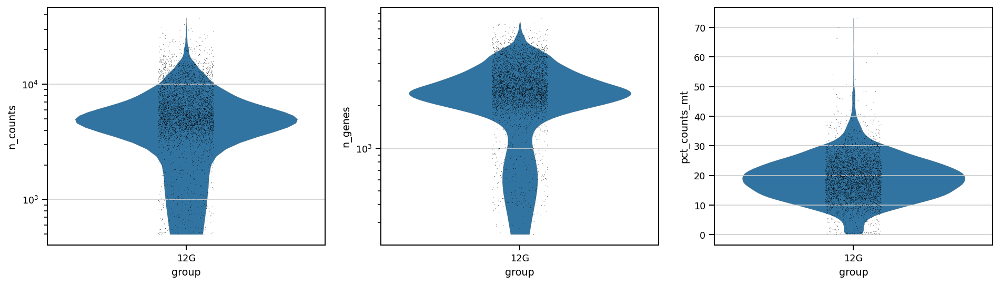

In [89]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(final, 'n_counts', groupby='group', size=0.5, log=True, cut=0, ax=ax1, show=False)
ax2_dict =  sc.pl.violin(final, 'n_genes', groupby='group', size=0.5, log=True, cut=0, ax=ax2, show=False)
ax3_dict = sc.pl.violin(final, 'pct_counts_mt', groupby='group',size=0.5, ax=ax3, show=False,)
savefig='figures/'+samplename + '_5_QC_violin_plots.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

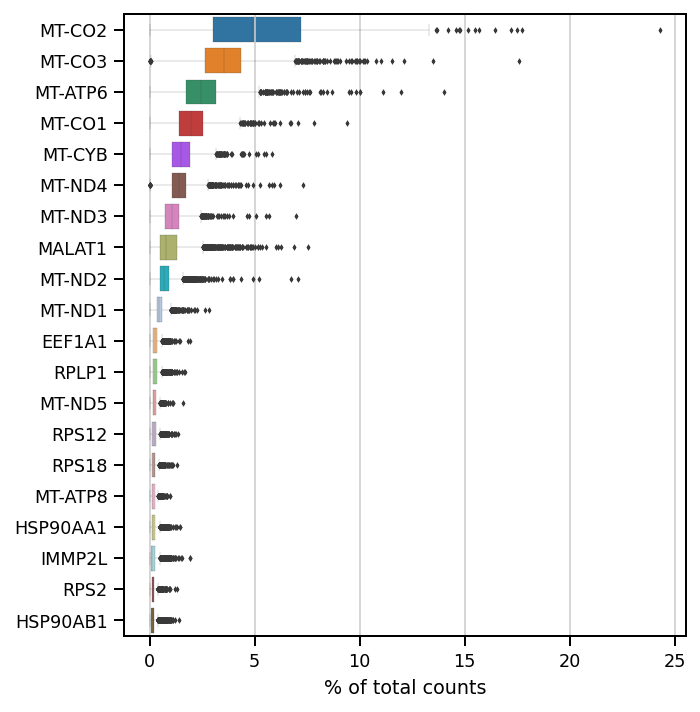

In [90]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
savefig='_'+samplename + '_6_QC_highest_expr_genes.pdf'
sc.pl.highest_expr_genes(final, n_top=20,save=savefig,)

In [91]:
print(final.obs['group'].value_counts())

12G    4225
Name: group, dtype: int64


In [92]:
final.obs['n_counts'].sum()/final.obs['group'].value_counts()

12G    6868.95858
Name: group, dtype: float64

In [93]:
final.obs['n_counts'].sum()

29021350.0

In [94]:
def h(counts=400, genes=400,mito=15):
    conditions = [(final.obs['predicted_doublet'] == True),(final.obs['n_genes_by_counts'] < counts),(final.obs['n_genes'] < genes),(final.obs['pct_counts_mt'] >mito),(final.obs['pct_counts_mt'] <= mito) & (final.obs['n_genes_by_counts'] >= counts) & (final.obs['n_genes'] >= genes)& (final.obs['predicted_doublet'] != True)]
    values = ['Doublet', 'Low_nFeature', 'Low_ngenes','High_MT', 'Passing']
    final.obs['QC'] = np.select(conditions, values)
    final.obs['QC'] = final.obs['QC'].astype('category')

    new_df1=pd.DataFrame(final.obs['QC'].value_counts()).reset_index()
    p=sb.barplot(x='index',y='QC',data=new_df1,color='sandybrown')
    show_values(p)


interactive_plot = interactive(h, counts=(0, 2000,20), genes=(0, 2000,20), mito=(0, 100, 1))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(IntSlider(value=400, description='counts', max=2000, step=20), IntSlider(value=400, desc…

In [95]:
final.obs['QC'].value_counts()

High_MT         2914
Passing         1259
Low_nFeature      37
Doublet           15
Name: QC, dtype: int64

In [ ]:
sb.set_context('paper')


fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(6, 3), dpi=150, sharey=False)
adata.obs['n_genes']

sb.histplot( final[final.obs['QC'] == 'Passing'].obs['n_genes'], ax=ax1, kde=True, bins=100)
sb.histplot( final[final.obs['QC'] == 'Passing'].obs['n_counts'], ax=ax2, kde=True, bins=100)
sb.histplot(final[final.obs['QC'] == 'Passing'].obs['pct_counts_mt'], ax=ax3, kde=True, bins=100)

ax1.title.set_text('n_genes')
ax2.title.set_text('n_counts')
ax3.title.set_text('mt_pct')

fig.text(0.00, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')

fig.tight_layout()
savefig='figures/'+samplename + '_3_QC_filtering_postfilter.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

In [96]:
final.layers["raw"] = final.X 
final.raw=adata
final.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(final, inplace=False)["X"])

In [97]:
sc.experimental.pp.recipe_pearson_residuals(final,n_top_genes=3000,n_comps=100,random_state=42,inplace=True)
final.layers["normalized"]=final.X

final

IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
markers = ["Th"]
hvgs = final.var["highly_variable"]
fig, ax = plt.subplots(figsize=(6, 6))
pl.scatter(
        final.var["mean_counts"], final.var["residual_variances"], s=3, edgecolor="none"
    )
pl.scatter(
        final.var["mean_counts"][hvgs],
        final.var["residual_variances"][hvgs],
        c="tab:red",
        label="selected genes",
        s=3,
        edgecolor="none",
    )
pl.scatter(
        final.var["mean_counts"][np.isin(final.var_names, markers)],
        final.var["residual_variances"][np.isin(final.var_names, markers)],
        c="k",
        label="known marker genes",
        s=10,
        edgecolor="black",
    )
ax.set_xscale("log")
ax.set_xlabel("mean expression")
ax.set_yscale("log")
ax.set_ylabel("residual variance")
ax.set_title(samplename)

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.yaxis.set_ticks_position("left")
ax.xaxis.set_ticks_position("bottom")

In [ ]:
s_genes = ['MCM5','PCNA','TYMS','FEN1','MCM7','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1',
           'UHRF1','CENPU','HELLS','RFC2','POLR1B','NASP','RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7',
           'POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
           'USP1','CLSPN','POLA1','CHAF1B','MRPL36','E2F8']
g2m_genes = ['HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B',
             'MKI67','TMPO','CENPF','TACC3','PIMREG','SMC4','CCNB2','CKAP2L','CKAP2','AURKB','BUB1',
             'KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','CDCA3','JPT1','CDC20','TTK','CDC25C',
             'KIF2C','RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1',
             'ANLN','LBR','CKAP5','CENPE','CTCF','NEK2','G2E3','GAS2L3','CBX5','CENPA']
cell_cycle_genes = s_genes + g2m_genes
display(len(s_genes))
display(len(g2m_genes))
display(len(cell_cycle_genes))
cell_cycle_genes = [x for x in cell_cycle_genes if x in final.var_names]
len(cell_cycle_genes)

In [ ]:
cell_cycle_genes = [x for x in cell_cycle_genes if x in final.var_names]
len(cell_cycle_genes)

In [ ]:
sc.tl.score_genes_cell_cycle(final, s_genes=s_genes, g2m_genes=g2m_genes)

# PART 5. Gen Set Enrichment Analysis

Install gseapy using pip. Full documentation could be explored here [gseapy](https://gseapy.readthedocs.io/en/latest/introduction.html)

In [ ]:
!pip install gseapy pybiomart

In [ ]:
import gseapy
from gseapy.plot import barplot, dotplot

Selelct the species for the Gen set enrichment analysis

In [ ]:
#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
gene_set_names = gseapy.get_library_name('Human')
print(gene_set_names)

re-run rank_genes for the propper annotation label

In [ ]:
#sc.tl.rank_genes_groups(cdata, 'treatmentcondition', method='t-test' ,key_added = "wilcoxon",layer='sct_corrected',use_raw=False)
sc.tl.rank_genes_groups(adata, 'sample', method='t-test' ,key_added = "wilcoxon",use_raw=False,layer='sqrt_norm')

Filter marker genes by adj p value and Fold change 

In [ ]:
# the analysis is done dataset  at the time, so you can select 1 cluster or 1 contrast. 
#here I'm selecting cluster 2, taking genes with adj pvalue<0.05 and log2fc>2


glist=sc.get.rank_genes_groups_df(adata, group='Cellline 2', key='wilcoxon',log2fc_min=2,pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))

Run enrichr using the list of genes in "glist". 

Select the geneset from the gene_set_names

In [ ]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='WikiPathways_2019_Mouse',
                     description='pathway',
                     cutoff = 0.05)

In [ ]:
enr_res.results.head(10)



In [ ]:
gseapy.barplot(enr_res.res2d,title='WikiPathways_2019_Mouse',save='WikiPathways_2019_Mouse')

In [ ]:
dotplot(enr_res.res2d, title='WikiPathways_2019_Mouse',cmap='viridis_r')

In [ ]:
Geneset='Azimuth_Cell_Types_2021'

In [ ]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets=Geneset,
                     description='pathway',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title=Geneset,save=Geneset)

In [ ]:
glist=sc.get.rank_genes_groups_df(adata, group='3', key='wilcoxon',log2fc_min=2,pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))

In [ ]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets=Geneset,
                     description='pathway',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title=Geneset,save=Geneset)

# PART 6.Automatic cell annotattion using scoreCT

In [ ]:
! git clone https://github.com/LucasESBS/scoreCT

In [ ]:
import scorect as ct

In [ ]:
# Load reference table - scoreCT api provides a wrapper for gmt, tsv and csv formats.
ref_marker = ct.read_markers_from_file('ref_marker2.csv').T

In [ ]:
ref_marker

In [ ]:
sc.tl.rank_genes_groups(adata, groupby='leiden_r0.2', n_genes=len(adata.raw.var), use_raw=True)

In [ ]:
# Wrangle results from existing sc.tl.rank_genes_groups() results
# Let's have a look for cluster 0
marker_df = ct.wrangle_ranks_from_anndata(adata)
print(marker_df.head())

In [ ]:
# Score cell types for each cluster 
# Let's set parameters first - K represents the number of genes included in the ranking
# m represents the number of bins used to divide the top K genes.
K = 300
m = 5
# Get the background genes - here, all the genes used to run the differential gene expression test
background = adata.raw.var.index.tolist()
# Now run the function
ct_pval, ct_score = ct.celltype_scores(nb_bins=m,
                                        ranked_genes=marker_df,
                                        K_top = K,
                                        marker_ref=ref_marker,
                                        background_genes=background,
                                        null_model='multinomial')

In [ ]:
# Now assign clusters to cell types
cluster_assign = adata.obs['leiden_r0.2']
celltype_assign = ct.assign_celltypes(cluster_assignment=cluster_assign, ct_pval_df=ct_pval, ct_score_df=ct_score, cutoff=0.1)
# Add to anndata object
adata.obs['scorect'] = celltype_assign
# Let's compare with the true assignment now! 
sc.pl.umap(adata, color=['scorect'], title=['True','Predicted'], cmap='Set2', wspace=0.33)

In [ ]:
# Let's have a look at the pvalue for clusters 0 and 1
ct.plot_pvalue(ct_pval, clusters=['0','1'], n_types=3)

# save the annotated h5ad object

In [ ]:
adata.write(samplename+'_'+ yourname +'_'+ 'annotated.h5ad')